In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
#import scanorama
import json
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

### Глобальные переменные

In [2]:
qc_palette = sns.color_palette(['red', 'gray'])

In [3]:
layer_palette = {'Empty spots': '#1f77b4',
                 'WM': '#bcbd22',
                 'L1': '#ff7f0e',
                 'L6': '#e377c2',
                 'L2': '#2ca02c',
                 'L3': '#d62728',
                 'L4': '#9467bd',
                 'L5': '#8c564b'}

In [4]:
def compute_3mad_intervals(df, column):
    mad = df[column].mad()
    median = df[column].median()
    left_mad  = median - 3 * mad
    right_mad = median + 3 * mad
    print(f'median = {median}, {[left_mad, right_mad]}')
    return median, left_mad, right_mad

# Подгрузим файлы

In [5]:
# Define paths and get sample_ids
file_list = os.listdir('../data/raw_spatial_data/human/')
file_list

['human_759', 'human_j12', 'human_j3', 'human_j4', 'human_j6']

In [6]:
file = 'human_759'

In [7]:
# аннотация слоёв
ann = pd.read_csv('../data/clusters/' + file + '.csv', index_col=0)
ann.columns = ['label']
ann.head()

,label
Barcode,
AAACAACGAATAGTTC-1,WM
AAACAATCTACTAGCA-1,WM
AAACACCAATAACTGC-1,L5
AAACAGAGCGACTCCT-1,Empty spots
AAACAGCTTTCAGAAG-1,L2


In [8]:
# каунты секвенирования
human_759 = sc.read_visium('../data/raw_spatial_data/human/'+ file)
human_759.var_names_make_unique()
human_759.obs['label'] = ann.label
human_759.obs['sample_id'] = file

reading ..\data\raw_spatial_data\human\human_759\filtered_feature_bc_matrix.h5
 (0:00:00)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Проверим все ли споты имеют аннотацию

In [9]:
human_759.obs.label.notna().value_counts()

True    3950
Name: label, dtype: int64

# Human_759

## Посчитаем метрики

In [10]:
human_759.var['mt'] = human_759.var_names.str.startswith('MT-')
human_759.var['hb'] = human_759.var_names.str.contains(("^HB[AB]"))
human_759.var['ribo'] = human_759.var_names.str.contains(("^RP[LS]"))

sc.pp.calculate_qc_metrics(
    human_759, qc_vars=['mt','hb','ribo'],
    percent_top=None, log1p=False, inplace=True)

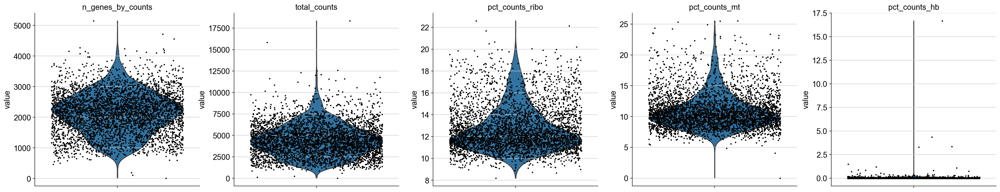

In [11]:
sc.pl.violin(human_759,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo', 'pct_counts_mt', 'pct_counts_hb'],
             jitter=0.4, rotation= 45, multi_panel=True, size=2.5)

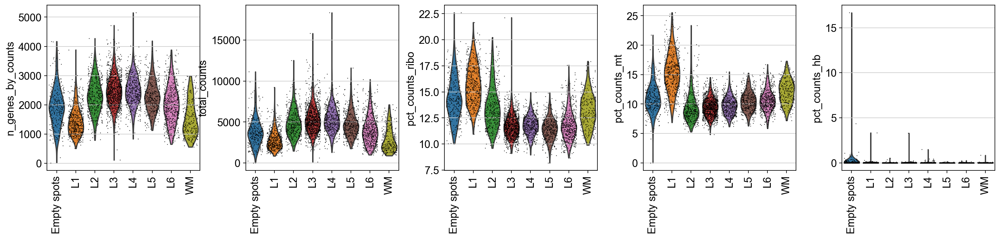

In [12]:
sc.pl.violin(human_759,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo','pct_counts_mt', 'pct_counts_hb'],
             jitter=0.4, groupby = 'label', rotation= 90, palette=layer_palette)

Видим, что число каунтов и задетектированых генов занижено у `L1` и `WM` слоёв. А так же Число процент митохондриальных генов завышен в `L1` слое. Поэтому хотелось бы быть с ними аккуратнее.

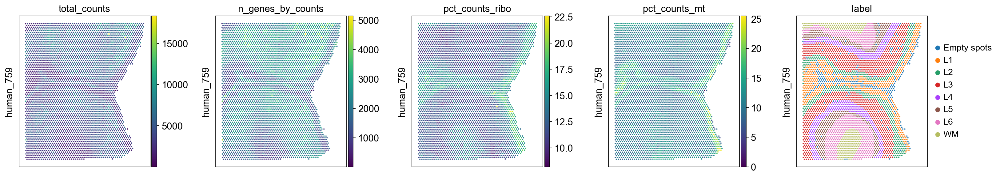

In [13]:
sq.pl.spatial_scatter(human_759,
                      color = ['total_counts', 'n_genes_by_counts','pct_counts_ribo','pct_counts_mt', 'label'],
                      ncols=5, img=False, axis_label=['', file])

### Libriary size

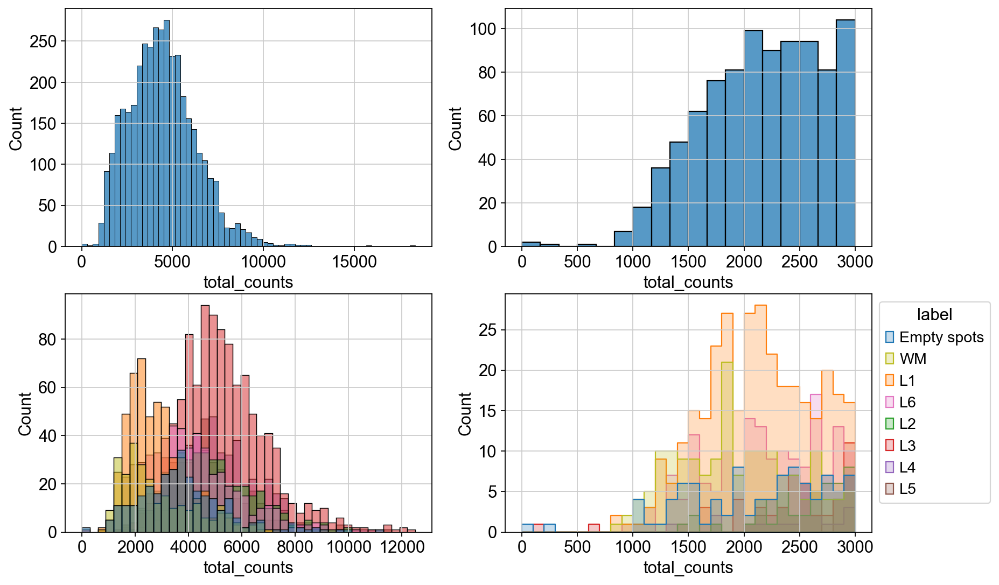

In [14]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(human_759.obs, x='total_counts', ax=axs[0][0])
sns.histplot(human_759.obs, x='total_counts', binrange=[0, 12500], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(human_759.obs, x='total_counts', binrange=[0, 3000], ax=axs[0][1])
sns.histplot(human_759.obs, x='total_counts', binrange=[0, 3000], bins=30, hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, fill=True, element="step")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Посчитаем 3MAD интервалы

In [15]:
median, left_3mad, right_3mad = compute_3mad_intervals(human_759.obs, 'total_counts')

median = 4311.5, [-38.001220703125, 8661.001220703125]


Выберем порог по `total counts = 1200`

In [16]:
human_759.obs['qc_lib_size'] = ((human_759.obs['total_counts'] > 1200) &
                                (human_759.obs['total_counts'] < 12000)).astype('string')
#human_759.obs['qc_lib_size'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)

vc = human_759.obs.groupby('qc_lib_size')['label'].value_counts()
print(f"число образцов не прошедших порог N={human_759.obs['qc_lib_size'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=39

label
WM             12
Empty spots     7
L1              7
L3              6
L6              5
L2              1
L4              1
Name: label, dtype: int64


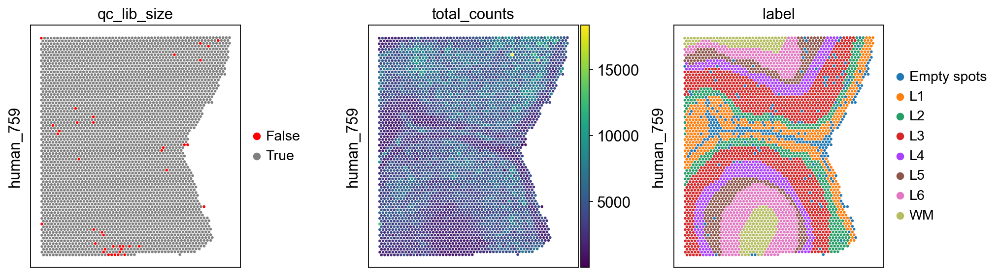

In [17]:
with qc_palette:
    sq.pl.spatial_scatter(human_759, color=['qc_lib_size', 'total_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Number of expressed features

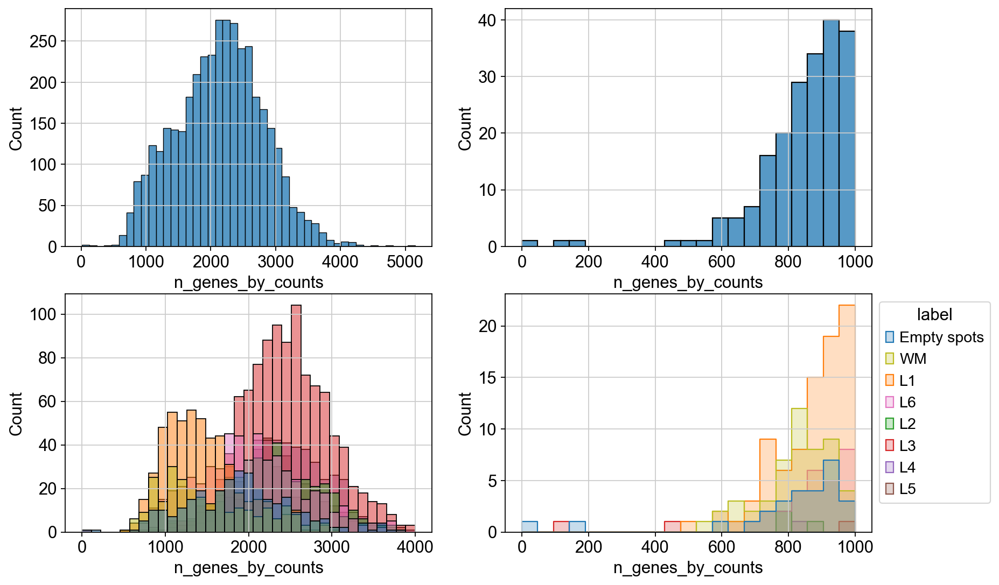

In [18]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(human_759.obs, x='n_genes_by_counts', ax=axs[0][0])
sns.histplot(human_759.obs, x='n_genes_by_counts', binrange=[0, 4000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(human_759.obs, x='n_genes_by_counts', binrange=[0, 1000], ax=axs[0][1])
sns.histplot(human_759.obs, x='n_genes_by_counts', binrange=[0, 1000], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, fill=True, element="step")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Выберем порог по `n_genes_by_counts = 700`

In [19]:
human_759.obs['qc_n_genes'] = (human_759.obs['n_genes_by_counts'] > 700).astype('string')
#human_759.obs['qc_n_genes'].replace({True: 'True', False: 'False'}, inplace=True)
vc = human_759.obs.groupby('qc_n_genes')['label'].value_counts()
print(f"число образцов не прошедших порог N={human_759.obs['qc_n_genes'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=20

label
WM             8
L1             5
Empty spots    4
L3             2
L6             1
Name: label, dtype: int64


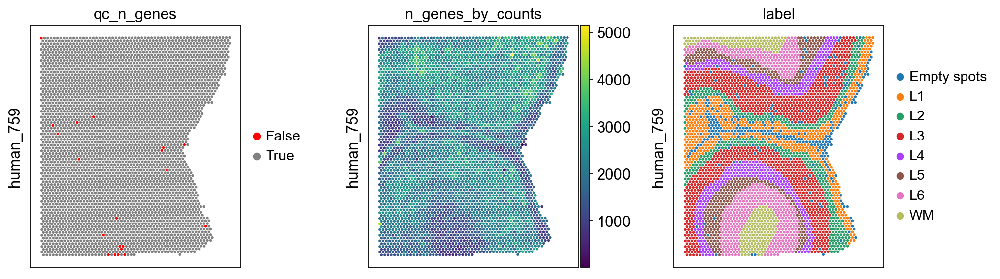

In [20]:
with qc_palette:
    sq.pl.spatial_scatter(human_759, color=['qc_n_genes', 'n_genes_by_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of mitochondrial reads

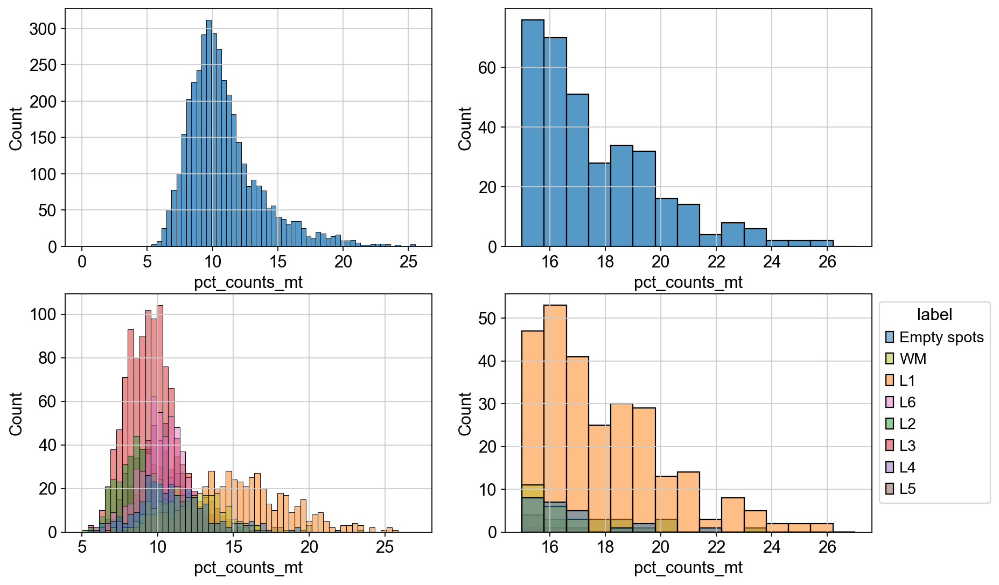

In [21]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']
hue_order_mito = ['WM', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(human_759.obs, x='pct_counts_mt', ax=axs[0][0])
sns.histplot(human_759.obs, x='pct_counts_mt', binrange=[5, 27], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(human_759.obs, x='pct_counts_mt', binrange=[15, 27], ax=axs[0][1])
sns.histplot(human_759.obs, x='pct_counts_mt', binrange=[15, 27], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

`pct_counts_mt = 19`


По митохондриям порог применяется ко всем кроме `L1` слоя. Для `L1` слоя посчитаем 3MAD интервалы

In [22]:
median, left_3mad, right_3mad = compute_3mad_intervals(human_759.obs[human_759.obs.label == 'L1'], 'pct_counts_mt')

median = 15.226730346679688, [7.22167181968689, 23.231788873672485]


In [23]:
human_759.obs['qc_mt'] = (((human_759.obs['pct_counts_mt'] <= 19) & (human_759.obs.label != 'L1')) |
                          ((human_759.obs['pct_counts_mt'] <= right_3mad) & (human_759.obs.label == 'L1'))).astype('string')
#human_759.obs['qc_mt'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)
vc = human_759.obs.groupby('qc_mt')['label'].value_counts()
print(f"число образцов не прошедших порог N={human_759.obs['qc_mt'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=16

label
L1             8
L2             5
Empty spots    3
Name: label, dtype: int64


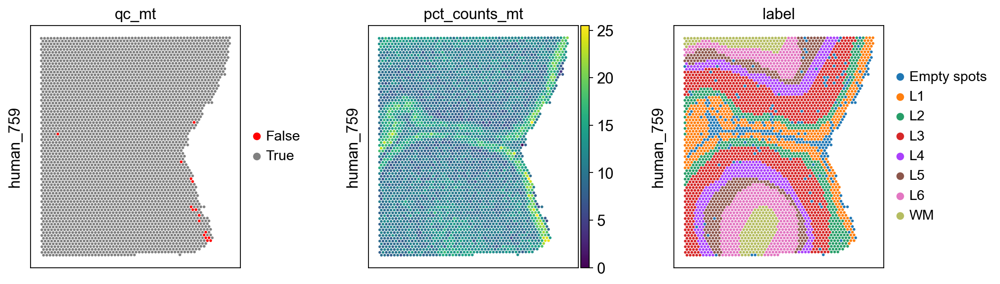

In [24]:
with qc_palette:
    sq.pl.spatial_scatter(human_759, color=['qc_mt', 'pct_counts_mt', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of ribosomal reads

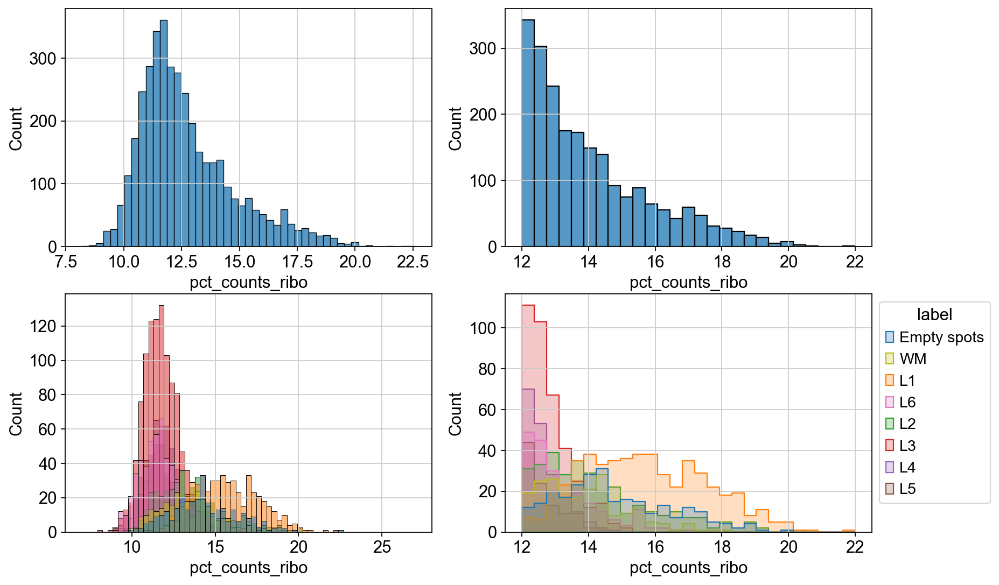

In [25]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(human_759.obs, x='pct_counts_ribo', ax=axs[0][0])
sns.histplot(human_759.obs, x='pct_counts_ribo', binrange=[7, 27], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(human_759.obs, x='pct_counts_ribo', binrange=[12, 22], ax=axs[0][1])
sns.histplot(human_759.obs, x='pct_counts_ribo', binrange=[12, 22], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, fill=True, element="step")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

`pct_counts_ribo = 19.5`


Посчитаем 3MAD для `L1` слоя

In [26]:
median, left_3mad, right_3mad = compute_3mad_intervals(human_759.obs[human_759.obs.label == 'L1'], 'pct_counts_ribo')

median = 15.500685691833496, [10.832647800445557, 20.168723583221436]


In [27]:
human_759.obs['qc_ribo'] = ((human_759.obs['pct_counts_ribo'] <= 19.5)).astype('string')
#human_759.obs['qc_mt'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)
vc = human_759.obs.groupby('qc_ribo')['label'].value_counts()
print(f"число образцов не прошедших порог N={human_759.obs['qc_ribo'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=18

label
L1             13
Empty spots     2
L2              2
L3              1
Name: label, dtype: int64


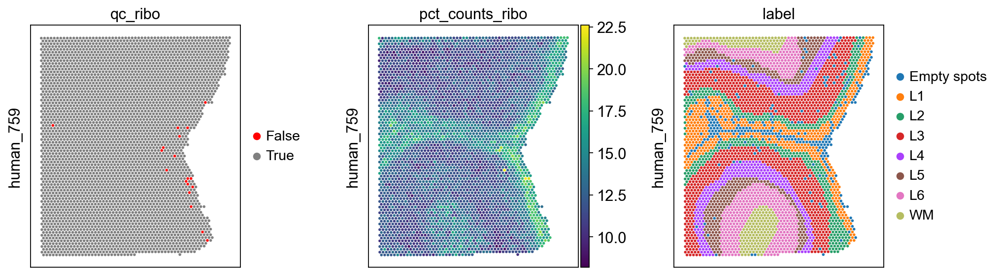

In [28]:
with qc_palette:
    sq.pl.spatial_scatter(human_759, color=['qc_ribo', 'pct_counts_ribo', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of hemoglobin reads

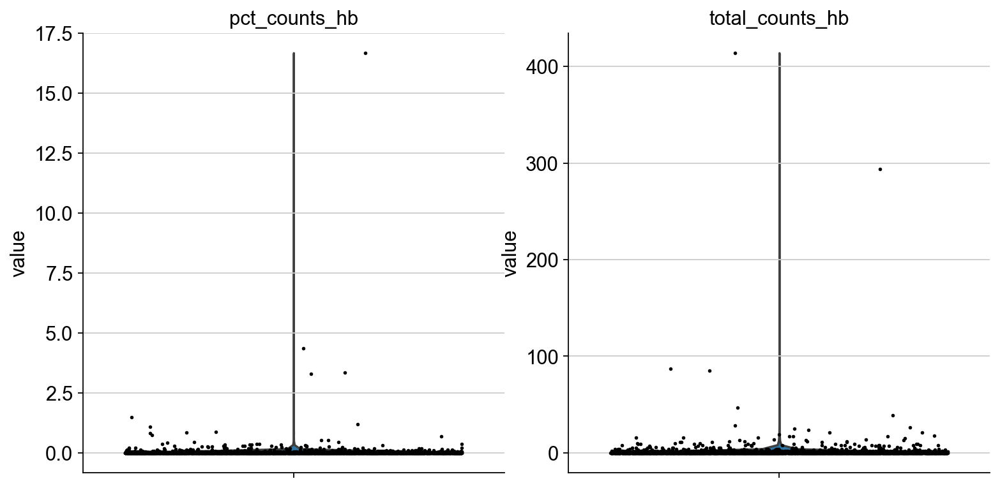

In [29]:
sc.pl.violin(human_759,
             keys = ['pct_counts_hb', 'total_counts_hb'], jitter=0.4, size=2.5, multi_panel=True)

Посчитаем 3MAD

In [30]:
median_pct, left_3mad_pct, right_3mad_pct = compute_3mad_intervals(human_759.obs, 'pct_counts_hb')
median, left_3mad, right_3mad = compute_3mad_intervals(human_759.obs, 'total_counts_hb')

median = 0.0, [-0.09731341525912285, 0.09731341525912285]
median = 0.0, [-3.5426487922668457, 3.5426487922668457]


In [31]:
human_759.obs['qc_hb'] = ((human_759.obs['total_counts_hb'] <= 7)).astype('string')
#human_759.obs['qc_mt'].replace({True: 'TRUE', False: 'FALSE'}, inplace=True)
vc = human_759.obs.groupby('qc_hb')['label'].value_counts()
print(f"число образцов не прошедших порог N={human_759.obs['qc_hb'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=63

label
Empty spots    38
L4             13
L3              4
L1              3
L2              3
L6              1
WM              1
Name: label, dtype: int64


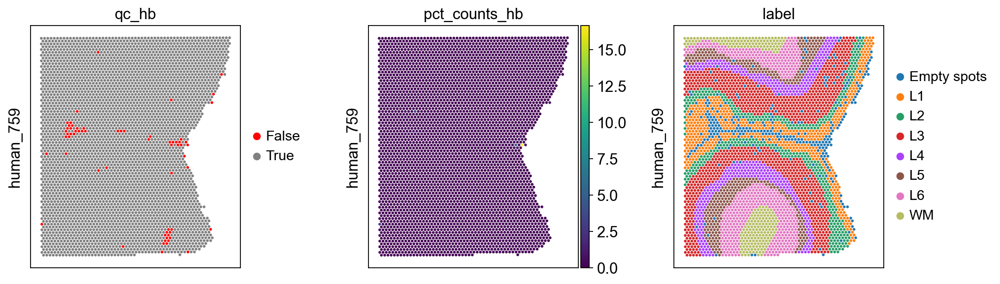

In [32]:
with qc_palette:
    sq.pl.spatial_scatter(human_759, color=['qc_hb', 'pct_counts_hb', 'label'], img=False, axis_label=['', file], size=1.3)

## Combined

### QC spatial_scatter

In [33]:
d = {'True': True, 'False': False}
human_759.obs['qc_lib_size'] = human_759.obs['qc_lib_size'].astype(object).replace(d)
human_759.obs['qc_n_genes'] = human_759.obs['qc_n_genes'].astype(object).replace(d)
human_759.obs['qc_mt'] = human_759.obs['qc_mt'].astype(object).replace(d)
human_759.obs['qc_ribo'] = human_759.obs['qc_ribo'].astype(object).replace(d)
human_759.obs['qc_hb'] = human_759.obs['qc_hb'].astype(object).replace(d)

In [34]:
human_759.obs['qc_good_spots'] = (human_759.obs.qc_lib_size * human_759.obs.qc_n_genes *
                                  human_759.obs.qc_mt * human_759.obs.qc_ribo * human_759.obs.qc_hb).astype('string')
vc = human_759.obs.groupby('qc_good_spots')['label'].value_counts()
print(f"число образцов не прошедших порог N={human_759.obs['qc_good_spots'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

число образцов не прошедших порог N=127

label
Empty spots    48
L1             27
L4             14
WM             13
L2             10
L3              9
L6              6
Name: label, dtype: int64


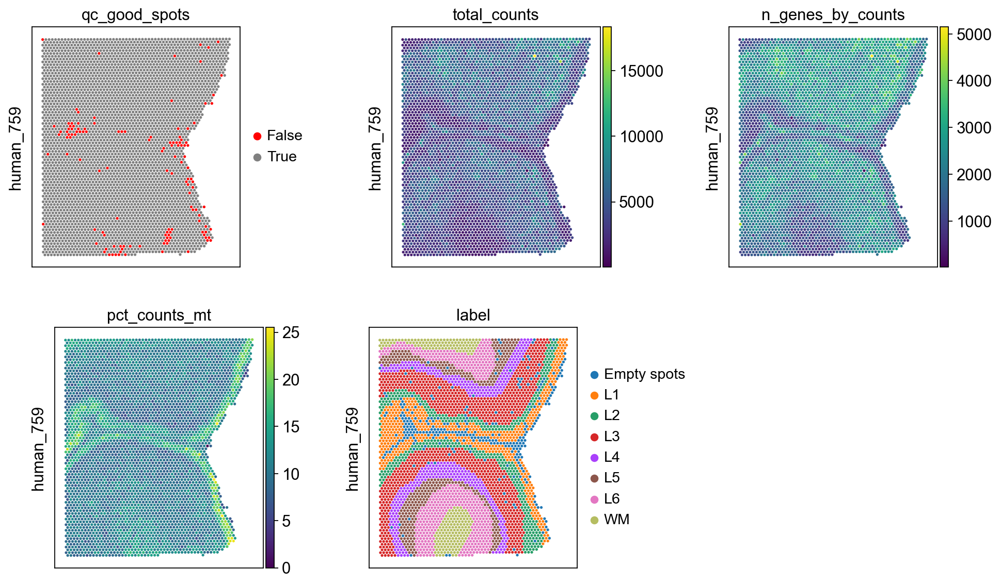

In [35]:
with qc_palette:
    sq.pl.spatial_scatter(human_759, color=['qc_good_spots',  'total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'label'],
                          img=False, axis_label=['', file], size=1.3, ncols=3)

### QC scatter plots

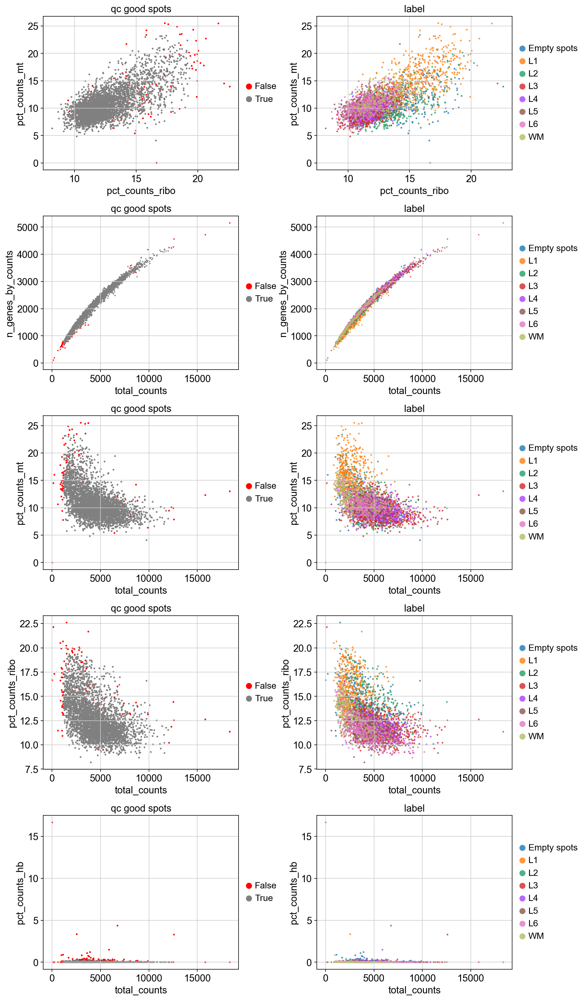

In [36]:
fig, ax = plt.subplots(5, 2, figsize=(12, 25), gridspec_kw={'wspace': 0.4, 'hspace': 0.3})
alpha = 0.8

sc.pl.scatter(human_759, x='pct_counts_ribo', y='pct_counts_mt', color="qc_good_spots", ax=ax[0][0], show=False, size=25)
sc.pl.scatter(human_759, x='pct_counts_ribo', y='pct_counts_mt', color="label", ax=ax[0][1], show=False, size=25, alpha=alpha)

sc.pl.scatter(human_759, x='total_counts', y='n_genes_by_counts', color="qc_good_spots", ax=ax[1][0], show=False, size=15)
sc.pl.scatter(human_759, x='total_counts', y='n_genes_by_counts', color="label", ax=ax[1][1], show=False, alpha=alpha, size=15)

sc.pl.scatter(human_759, x='total_counts', y='pct_counts_mt', color="qc_good_spots", ax=ax[2][0], show=False, size=25)
sc.pl.scatter(human_759, x='total_counts', y='pct_counts_mt', color="label", ax=ax[2][1], show=False, alpha=alpha, size=25)

sc.pl.scatter(human_759, x='total_counts', y='pct_counts_ribo', color="qc_good_spots", ax=ax[3][0], show=False, size=25)
sc.pl.scatter(human_759, x='total_counts', y='pct_counts_ribo', color="label", ax=ax[3][1], show=False, alpha=alpha, size=25)

sc.pl.scatter(human_759, x='total_counts', y='pct_counts_hb', color="qc_good_spots", ax=ax[4][0], show=False, size=25)
sc.pl.scatter(human_759, x='total_counts', y='pct_counts_hb', color="label", ax=ax[4][1], show=False, alpha=alpha, size=25)
plt.show()

Меня всё же напрягают немного образцы со слишком большой глубиной секвенирования

### Cохраним отфильтрованые споты (без пустых)

In [37]:
good_spots = human_759.obs[(human_759.obs.qc_good_spots == 'True') & (human_759.obs.label != 'Empty spots')].index

In [38]:
human_759_filtered = human_759[good_spots].copy()

### PCA

In [39]:
sc.pp.normalize_total(human_759, target_sum=1e4)
sc.pp.log1p(human_759)
sc.tl.pca(human_759)

normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:36)


C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\aleks\anaconda3\envs\scanorama39\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


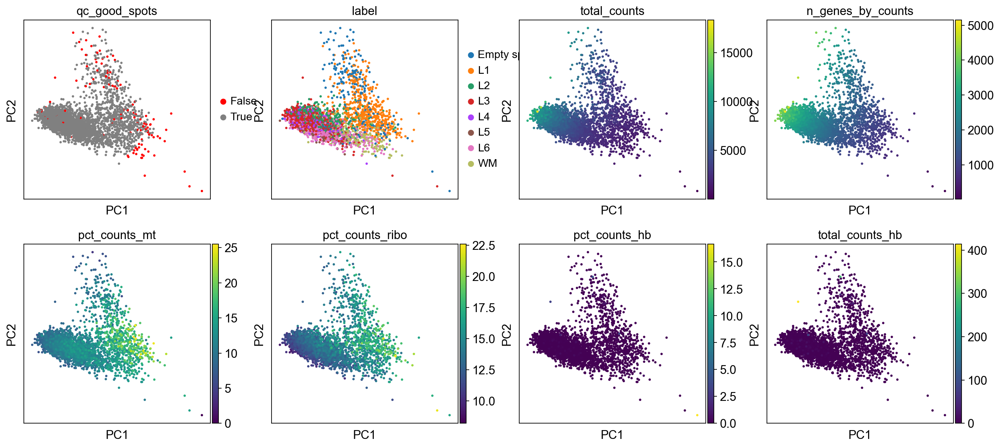

In [40]:
sc.pl.pca(human_759, 
          color=['qc_good_spots', 'label', 'total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'total_counts_hb'],
          ncols=4, show=True)

Видим, что образцы в правом нижнем углу мы могли отфильтровать только по `pct_counts_ribo` и `pct_counts_hb`

## Сохраним в .h5ad

In [41]:
human_759_filtered.obs.drop(['qc_lib_size','qc_n_genes', 'qc_mt', 'qc_good_spots', 'qc_hb', 'qc_ribo'], axis=1, inplace=True)

In [42]:
os.makedirs('../results/filtered_samples', exist_ok=True)
os.makedirs('../results/filtered_samples/human', exist_ok=True)
human_759_filtered.write_h5ad(f'../results/filtered_samples/human/{file}.h5ad')